In [21]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np

import pyart
import wradlib as wrl
import pandas as pd
import tempfile
import os

import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import cartopy.feature as cfeature

from copy import deepcopy
import boto3
from botocore.handlers import disable_signing

import datetime as dt
import pytz

In [2]:
# setup radar specs
radarshortname = 'KMUX'
#sitecoords = (-121.89844512939453,  37.15522384643555, 1081)   # site coordinates KMUX
#sitecoords = (-119.63214111328125,  36.31418228149414, 103)   # site coordinates KHNX
#sitecoords = (-120.39694, 34.83805 ,375)    # site coordinates KVBX
nrays = 360                                 # number of rays
nbins = 1832                                 # number of range bins
el = 0.5                                    # vertical antenna pointing angle (deg)
bw = 1.0                                    # half power beam width (deg)
range_res = 250.                            # range resolution (meters)

In [3]:
def get_radar_scan(station='KLOT', date=None, key_index=-20):
    
    '''
    Function will pull the latest radar scan from any radar site using 
    Amazon S3.
    ----------
    Station = Four letter NEXRAD identifier
              Example: 'KEPZ'
    Date = default is none for current date, else enter date in format "YYYY/MM/DD"
    Ex: date ='2013/11/17
    Key_index = Number of keys you want pulled from most recent scan.
    Ex: key_index = -15 would pull ht most recent 15 scans
    '''
    
    # Creating a bucket and a client to be able to pull data from AWS and setting it as unsigned
    bucket = 'noaa-nexrad-level2'
    s3 = boto3.resource('s3')
    s3.meta.client.meta.events.register('choose-signer.s3.*', disable_signing)
    
    # Connects the bucket create above with radar data
    aws_radar = s3.Bucket(bucket)
    
    # Setting the date and time to current...
    # This will allow for allow the current date's radar scands to be pulled
    if date == None:
        target_string = datetime.datetime.utcnow().strftime('%Y/%m/%d/'+station)
    else:
        target_string = date+'/'+station
    
    for obj in aws_radar.objects.filter(Prefix= target_string):
        '{0}:{1}'.format(aws_radar.name, obj.key)
    my_list_of_keys = [this_object.key for this_object in aws_radar.objects.filter(Prefix= target_string)]
    keys = my_list_of_keys[key_index:]
    newkeys = []
    for key in keys:
        if 'MDM' in key:
            pass
        elif key.endswith('.tar'):
            pass
        else:
            newkeys.append(key)
    #print(newkeys)
    return aws_radar, newkeys

In [4]:
def read_frame(aws_radar,keys,nframe):
    # open a temporary local file
    localfile = tempfile.NamedTemporaryFile(delete=False)
    localfile_name = localfile.name
    localfile.close()

    # download to temporary file and read to radar object using pyart
    aws_radar.download_file(keys[nframe], localfile_name)
    radar = pyart.io.read(localfile_name)

    # delete temporary file to save space
    os.remove(localfile_name)
    return radar

def get_radar_field(radar):

    gatefilter = pyart.filters.GateFilter(radar)
    gatefilter.exclude_transition()
    gatefilter.exclude_masked('reflectivity')
    # Mask reflectivity
    radar.fields["corrected_reflectivity"] = deepcopy(radar.fields["reflectivity"])
    radar.fields["corrected_reflectivity"]["data"] = np.ma.masked_where(
        gatefilter._gate_excluded, radar.fields["corrected_reflectivity"]["data"])
    rr = pyart.retrieve.est_rain_rate_z(radar, refl_field="corrected_reflectivity")
    radar.add_field('rainrate',rr,replace_existing=True)
    # Mask out last 10 gates of each ray, this removes the "ring" around the radar.
    radar.fields['rainrate']['data'][:, -10:] = np.ma.masked
    
    return radar,gatefilter

In [24]:
# Setting radar, date of radar scans needed, and key index (amount of items in list)
radarfile_kmux, keys_kmux = get_radar_scan(station='KMUX', date='2017/01/08', key_index=-400)
#radarfile_khnx, keys_khnx = get_radar_scan(station='KHNX', date='2019/05/19', key_index=-400)

In [41]:
# loop through the keys by iterating nframe
nframe = 255

radar_kmux = read_frame(radarfile_kmux, keys_kmux,nframe)

In [42]:
rad_kmux,gatefilter_kmux = get_radar_field(radar_kmux)

KMUX is running under VCP 212

In [43]:
rhi_radar = pyart.util.xsect.cross_section_ppi(rad_kmux, [120])

(0, 50)

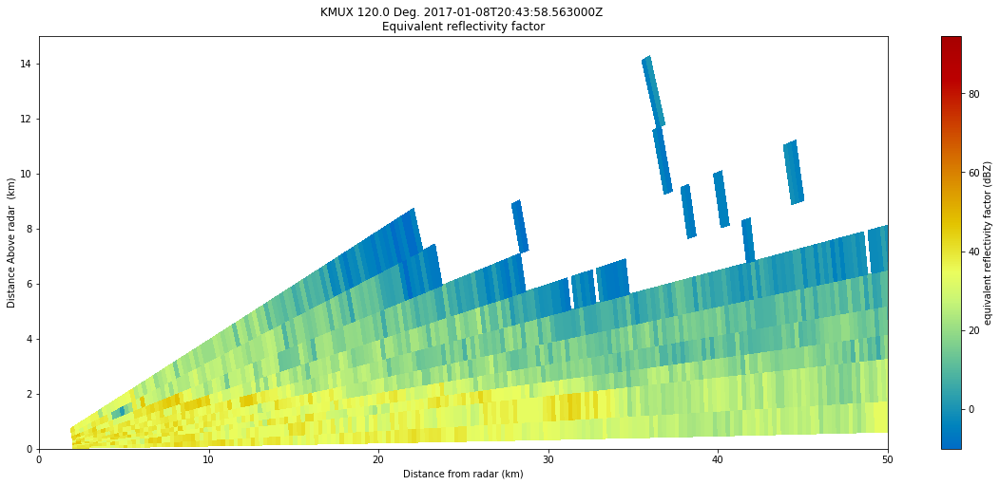

In [44]:

myf = plt.figure(figsize=[20,8])
display = pyart.graph.RadarDisplay(rhi_radar)
display.plot_rhi('reflectivity', 0, vmin=-10)
plt.ylim([0,15])
plt.xlim([0,50])

In [51]:
timestr = rad_kmux.time['units'].strip('seconds since')
savefname = dt.datetime.strftime(dt.datetime.strptime(timestr,'%Y-%m-%dT%H:%M:%SZ'),'RHI_KMUX_%Y%m%d_%H%M%SZ.png')
print(savefname)

RHI_KMUX_20170108_204357Z.png


In [56]:
len(keys_kmux)

292

In [57]:
keys_kmux

['2017/01/08/KMUX/KMUX20170108_000154_V06',
 '2017/01/08/KMUX/KMUX20170108_000552_V06',
 '2017/01/08/KMUX/KMUX20170108_001004_V06',
 '2017/01/08/KMUX/KMUX20170108_001415_V06',
 '2017/01/08/KMUX/KMUX20170108_001826_V06',
 '2017/01/08/KMUX/KMUX20170108_002238_V06',
 '2017/01/08/KMUX/KMUX20170108_002703_V06',
 '2017/01/08/KMUX/KMUX20170108_003115_V06',
 '2017/01/08/KMUX/KMUX20170108_003540_V06',
 '2017/01/08/KMUX/KMUX20170108_004005_V06',
 '2017/01/08/KMUX/KMUX20170108_004443_V06',
 '2017/01/08/KMUX/KMUX20170108_004909_V06',
 '2017/01/08/KMUX/KMUX20170108_005334_V06',
 '2017/01/08/KMUX/KMUX20170108_005812_V06',
 '2017/01/08/KMUX/KMUX20170108_010306_V06',
 '2017/01/08/KMUX/KMUX20170108_010745_V06',
 '2017/01/08/KMUX/KMUX20170108_011223_V06',
 '2017/01/08/KMUX/KMUX20170108_011703_V06',
 '2017/01/08/KMUX/KMUX20170108_012141_V06',
 '2017/01/08/KMUX/KMUX20170108_012607_V06',
 '2017/01/08/KMUX/KMUX20170108_013018_V06',
 '2017/01/08/KMUX/KMUX20170108_013415_V06',
 '2017/01/08/KMUX/KMUX20170108_0

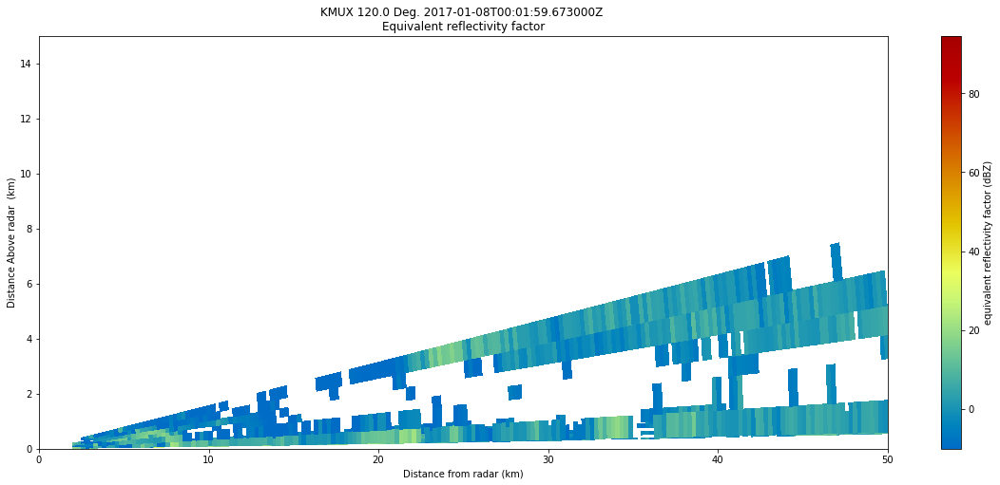

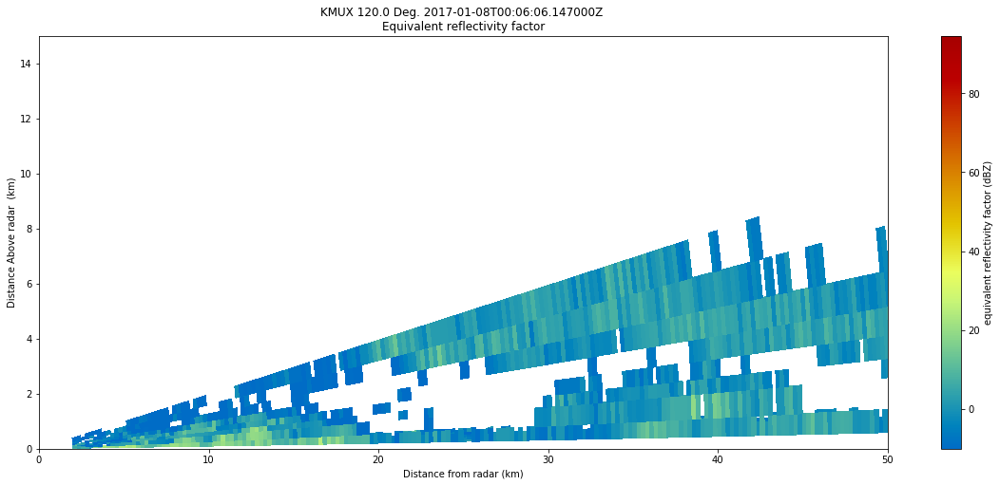

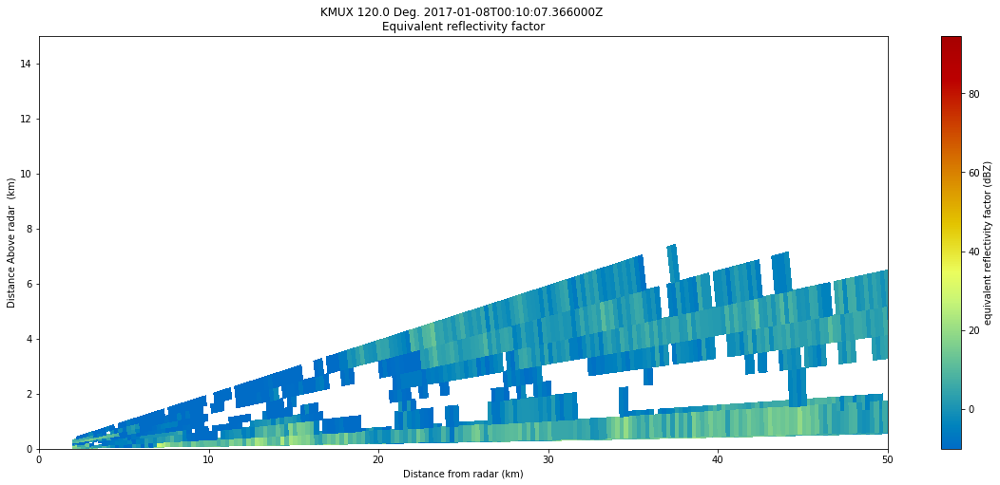

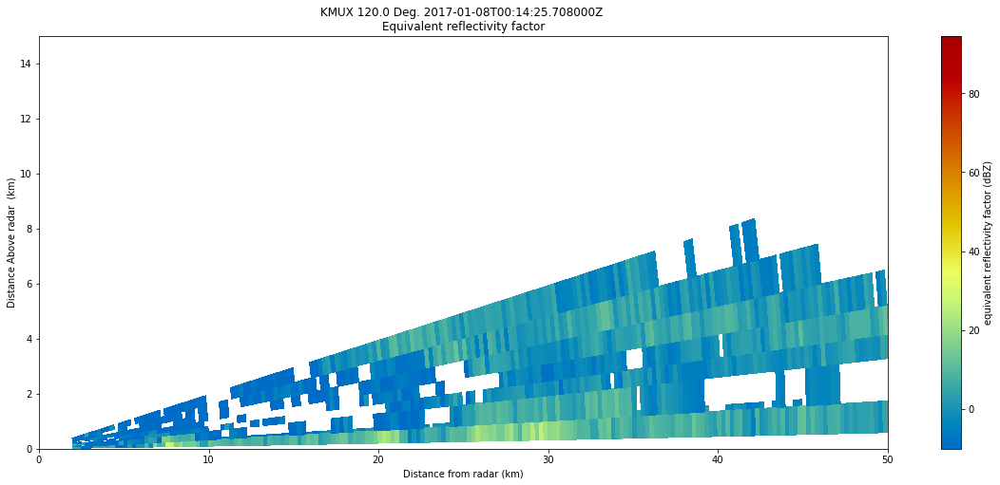

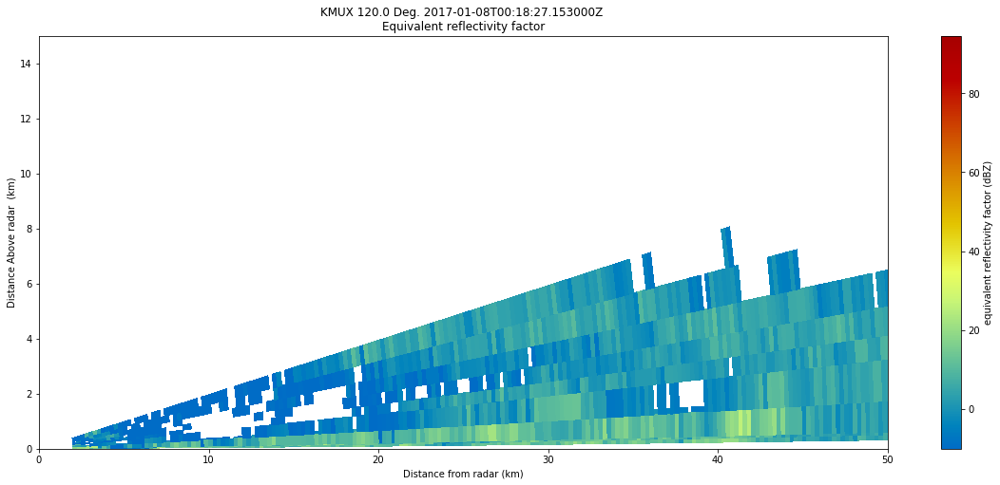

...

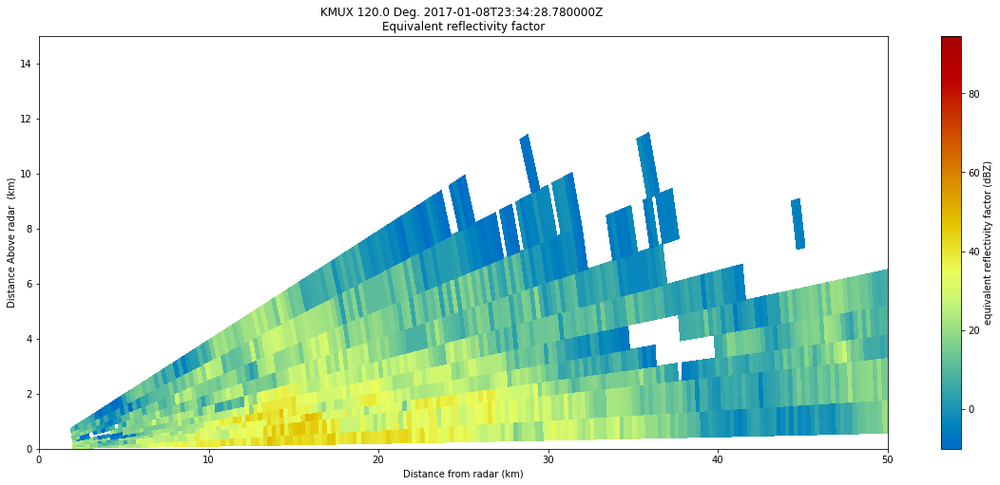

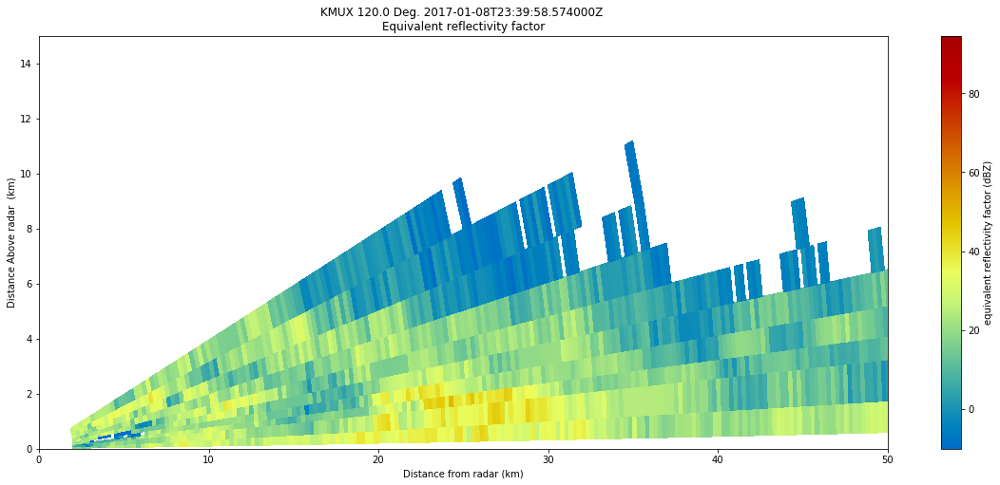

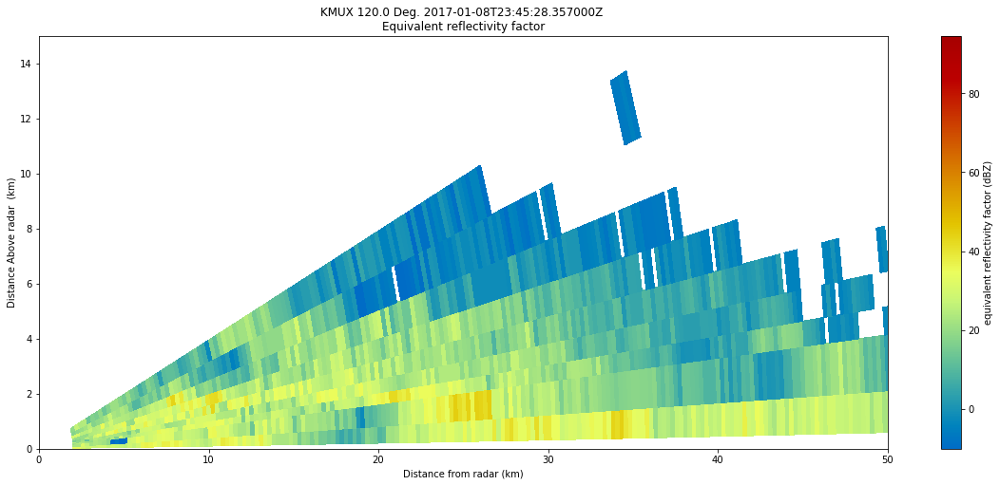

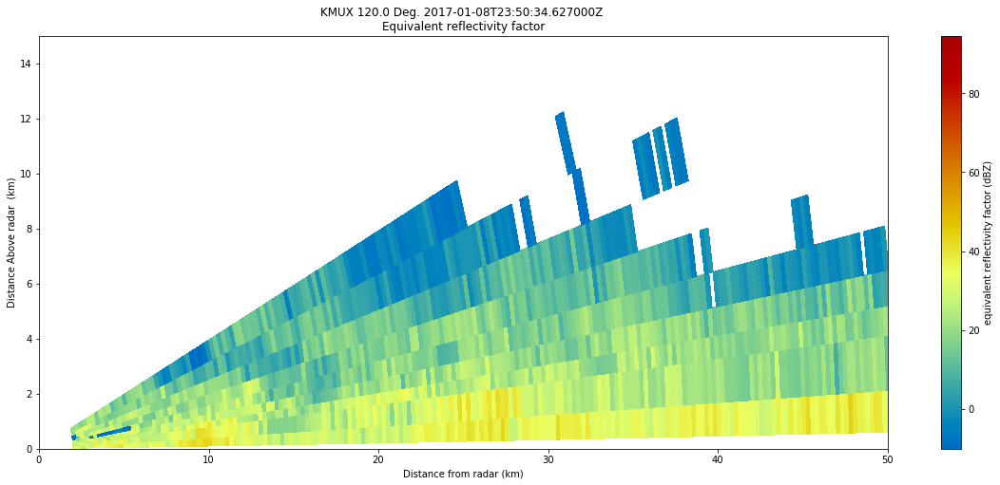

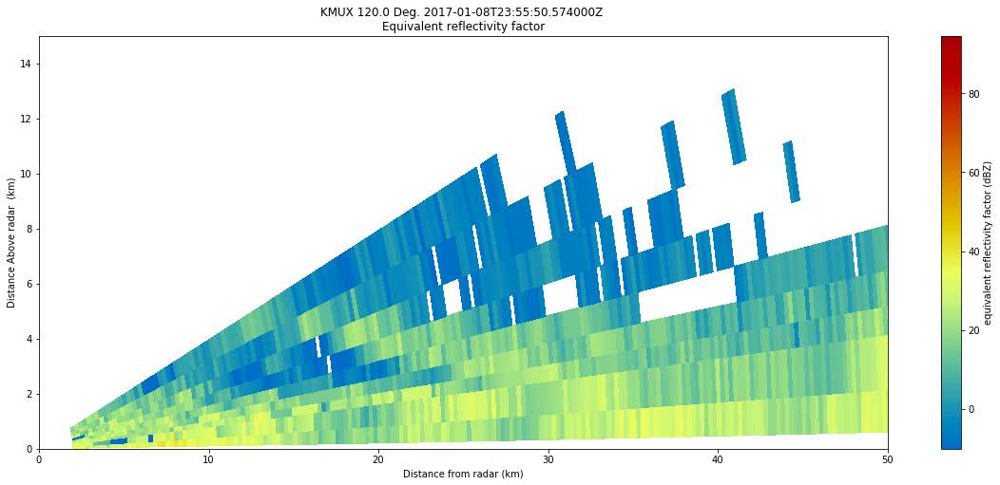

In [59]:
for nframe in range(len(keys_kmux)):
    radar_kmux = read_frame(radarfile_kmux,keys_kmux,nframe)
    
    rad_kmux,gatefilter_kmux = get_radar_field(radar_kmux)
    
    rhi_radar = pyart.util.xsect.cross_section_ppi(rad_kmux, [120])
    
    timestr = rad_kmux.time['units'].strip('seconds since')
    
    projection = ccrs.PlateCarree()

    fig = plt.figure(figsize=[20,8])
    display = pyart.graph.RadarDisplay(rhi_radar)
    display.plot_rhi('reflectivity', 0, vmin=-10)
    plt.ylim([0,15])
    plt.xlim([0,50])
    
    savefname = dt.datetime.strftime(dt.datetime.strptime(timestr,'%Y-%m-%dT%H:%M:%SZ'),'RHI_KMUX_150AZ_%Y%m%d_%H%M%SZ.png')
    plt.savefig(savefname)